#### Câu hỏi nghiên cứu: *Dựa trên hành vi mua sắm thực tế, làm thế nào để nhận diện phân khúc khách hàng trên Olist và xây dựng các giải pháp chiến lược phù hợp nhằm gia tăng sự gắn bó lâu dài của khách hàng với nền tảng?*

**Mục tiêu:**

Áp dụng mô hình phân tích RFM kết hợp cùng thuật toán K - Means để giải quyết bài toán phân khúc khách hàng trên nền tảng thương mại điện tử Olist:

   \- Nhận diện phân khúc: Sử dụng bộ ba chỉ số Recency, Frequency và Monetary để định lượng và phân loại khách hàng thành các nhóm hành vi riêng biệt.
   
   \- Xây dựng chiến lược: Dựa trên đặc điểm của từng phân khúc để đề xuất các giải pháp chiến lược, từ đó gia tăng sự gắn bó lâu dài của khách hàng với Olist.

**Phương pháp thực hiện:**

   \- Trích xuất đặc trưng RFM.
   
   \- Tiền xử lý.
   
   \- Xác định số cụm tối ưu.
   
   \- Phân cụm và định danh khách hàng.
    
   \- Trực quan hóa và đề xuất chiến lược.

## 1. Chuẩn bị dữ liệu (Data Preparation)

Đọc file master_data.csv. Chuyển đổi cột thời gian về định dạng chuẩn và kiểm tra sơ bộ các thông tin tài chính cần thiết cho mô hình RFM.

In [1]:
import pandas as pd
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('master_data.csv')

# Chuyển đổi định dạng ngày tháng
df['order_purchase_timestamp'] = pd.to_datetime(df['order_purchase_timestamp'])

# Tính toán cột giá trị đơn hàng (Price + Freight)
df['total_order_value'] = df['price'] + df['freight_value']

cols = [
    'customer_unique_id',
    'order_purchase_timestamp',
    'price',
    'freight_value',
    'total_order_value'
]

print("Thông tin dữ liệu:")
print(df[cols].info())
df[cols].head()

Thông tin dữ liệu:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110012 entries, 0 to 110011
Data columns (total 5 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   customer_unique_id        110012 non-null  object        
 1   order_purchase_timestamp  110012 non-null  datetime64[ns]
 2   price                     110012 non-null  float64       
 3   freight_value             110012 non-null  float64       
 4   total_order_value         110012 non-null  float64       
dtypes: datetime64[ns](1), float64(3), object(1)
memory usage: 4.2+ MB
None


,customer_unique_id,order_purchase_timestamp,price,freight_value,total_order_value
0,7c396fd4830fd04220f754e42b4e5bff,2017-10-02 10:56:00,29.99,8.72,38.71
1,af07308b275d755c9edb36a90c618231,2018-07-24 20:41:00,118.70,22.76,141.46
2,3a653a41f6f9fc3d2a113cf8398680e8,2018-08-08 08:38:00,159.90,19.22,179.12
3,7c142cf63193a1473d2e66489a9ae977,2017-11-18 19:28:00,45.00,27.20,72.20
4,72632f0f9dd73dfee390c9b22eb56dd6,2018-02-13 21:18:00,19.90,8.72,28.62


## 2. Tạo đặc trưng (Feature Engineering): RFM

Trích xuất 3 chỉ số hành vi cốt lõi từ dữ liệu giao dịch:

   \- Recency (R): Số ngày kể từ lần mua cuối cùng.

   \- Frequency (F): Tổng số đơn hàng thành công.

   \- Monetary (M): Tổng giá trị chi tiêu (bao gồm cả giá sản phẩm và phí vận chuyển).

Ngày phân tích dữ liệu (Snapshot Date): 2018-08-30 15:00:00

--- Kết quả RFM ---


,customer_unique_id,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19
2,0000f46a3911fa3c0805444483337064,537,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89



--- Thống kê mô tả dữ liệu RFM ---
            Recency     Frequency      Monetary
count  92753.000000  92753.000000  92753.000000
mean     237.827811      1.033174    165.607741
std      152.630192      0.208417    226.477512
min        1.000000      1.000000      9.590000
25%      114.000000      1.000000     63.020000
50%      219.000000      1.000000    107.800000
75%      346.000000      1.000000    182.860000
max      714.000000     15.000000  13664.080000

File 'rfm_data.csv' đã được tạo.


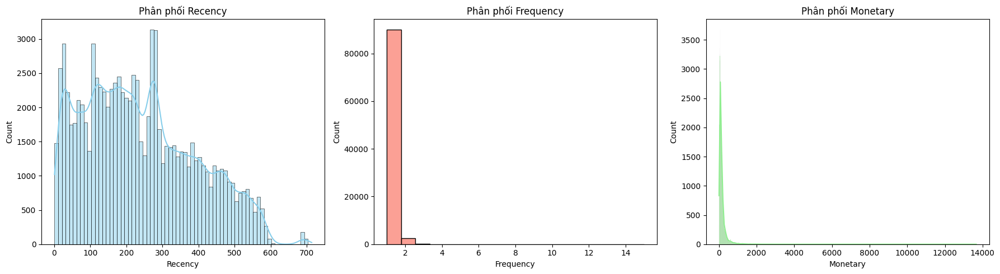

In [2]:
# Xác định ngày phân tích (Snapshot date), lấy ngày cuối cùng có trong dữ liệu cộng thêm 1 ngày
snapshot_date = df['order_purchase_timestamp'].max() + dt.timedelta(days=1)
print(f"Ngày phân tích dữ liệu (Snapshot Date): {snapshot_date}")

# Tính toán RFM
rfm_df = df.groupby('customer_unique_id').agg({
    'order_purchase_timestamp': lambda x: (snapshot_date - x.max()).days, # Recency
    'order_id': 'nunique',                                                # Frequency
    'total_order_value': 'sum'                                            # Monetary
}).reset_index()

# Đổi tên cột RFM
rfm_df.rename(columns={
    'order_purchase_timestamp': 'Recency',
    'order_id': 'Frequency',
    'total_order_value': 'Monetary'
}, inplace=True)

print("\n--- Kết quả RFM ---")
display(rfm_df.head())

# Thống kê mô tả (Descriptive Statistics)
print("\n--- Thống kê mô tả dữ liệu RFM ---")
print(rfm_df.describe())

rfm_df.to_csv('rfm_data.csv', index=True)
print("\nFile 'rfm_data.csv' đã được tạo.")

# Vẽ biểu đồ phân phối chỉ số RFM
plt.figure(figsize=(18, 5))

# Biểu đồ Recency
plt.subplot(1, 3, 1)
sns.histplot(rfm_df['Recency'], kde=True, color='skyblue')
plt.title('Phân phối Recency')

# Biểu đồ Frequency
plt.subplot(1, 3, 2)
sns.histplot(rfm_df['Frequency'], kde=False, color='salmon')
plt.title('Phân phối Frequency')

# Biểu đồ Monetary
plt.subplot(1, 3, 3)
sns.histplot(rfm_df['Monetary'], kde=True, color='lightgreen')
plt.title('Phân phối Monetary')

plt.tight_layout()
plt.show()

*Nhận xét:*

   \- Thời gian mua hàng gần nhất (Recency): Phân tán rộng, lượng lớn khách hàng đã ngừng tương tác trên 200 ngày, cảnh báo rủi ro rời bỏ cao.

   \- Tần suất mua hàng (Frequency): Tập trung chủ yếu ở mức 1 lần mua, cho thấy tỷ lệ giữ chân khách hàng còn thấp.

   \- Giá trị chi tiêu (Monetary): Lệch phải nghiêm trọng; phần lớn chi tiêu thấp nhưng có một nhóm nhỏ khách hàng chi tiêu cao đóng góp doanh thu lớn.
   
   \- Kỹ thuật xử lý: Do sự chênh lệch lớn về thang đo giữa các biến, cần chuẩn hóa bằng `StandardScaler` để đảm bảo Monetary không áp đảo kết quả và mô hình phân cụm chính xác hơn.

*Kết luận:* Dữ liệu cho thấy nhu cầu cấp thiết phải phân cụm để triển khai chiến dịch chăm sóc riêng biệt, đặc biệt là nhóm khách hàng mới và khách hàng tiềm năng vốn chiếm tỷ trọng lớn nhất.

## 3. Phân khúc khách hàng bằng K - Means
Dựa trên dữ liệu hành vi RFM đã tính toán, nhóm áp dụng thuật toán *K - Means Clustering* để gom nhóm các khách hàng có đặc điểm tương đồng.

Quy trình thực hiện:

   \- Chuẩn hóa dữ liệu: K-Means sử dụng khoảng cách Euclid, nên các biến (Recency, Frequency, Monetary) bắt buộc phải được đưa về cùng một thang đo (Standardization).
     
  \- Chọn K tối ưu: Sử dụng phương pháp Elbow (Khuỷu tay) để xác định số lượng cụm hợp lý.
    
  \- Gom cụm & đánh giá: Chạy mô hình và đánh giá độ tách biệt bằng Silhouette Score.

### 3.1. Chuẩn bị dữ liệu
\- Input: File `rfm_data.csv`.

\- Xử lý: Chuẩn hóa dữ liệu (Standardization): Do các chỉ số Recency (tính bằng ngày), Frequency (tính bằng số đơn hàng) và Monetary (tính bằng giá trị tiền) có đơn vị và thang đo hoàn toàn khác nhau. Để thuật toán *K - Means* hoạt động hiệu quả, cần đưa tất cả về cùng một phân phối có giá trị trung bình (mean) là $0$ và độ lệch chuẩn (standard deviation) là $1$.

In [3]:
from sklearn.preprocessing import StandardScaler

rfm_df = pd.read_csv('rfm_data.csv')

# Chuẩn hóa dữ liệu (Mean = 0, Std = 1)
scaler = StandardScaler()
rfm_scaled = scaler.fit_transform(rfm_df[['Recency', 'Frequency', 'Monetary']])

rfm_scaled_df = pd.DataFrame(rfm_scaled, columns=['Recency', 'Frequency', 'Monetary'])
print("Dữ liệu sau khi chuẩn hóa:")
rfm_scaled_df.head()

Dữ liệu sau khi chuẩn hóa:


,Recency,Frequency,Monetary
0,-0.824401,-0.159173,-0.104681
1,-0.804746,-0.159173,-0.611180
2,1.960122,-0.159173,-0.350534
3,0.544929,-0.159173,-0.538634
4,0.328719,-0.159173,0.138126


### 3.2. Xác định số cụm K tối ưu (Phương pháp Elbow)

Một thách thức của thuật toán K-Means là phải xác định trước số lượng cụm (K). Để chọn K hợp lý, ta sử dụng phương pháp Khuỷu tay (Elbow Method).

Nguyên lý:

\- Ta chạy thuật toán với K thay đổi từ 1 đến 10.

\- Tính chỉ số Inertia (Tổng bình phương khoảng cách từ các điểm đến tâm cụm).

\- Khi K tăng, Inertia sẽ giảm. Ta chọn điểm K mà tại đó tốc độ giảm của Inertia bắt đầu chững lại (tạo thành hình khuỷu tay). Đó là điểm cân bằng tốt nhất giữa độ nén của cụm và độ phức tạp của mô hình.

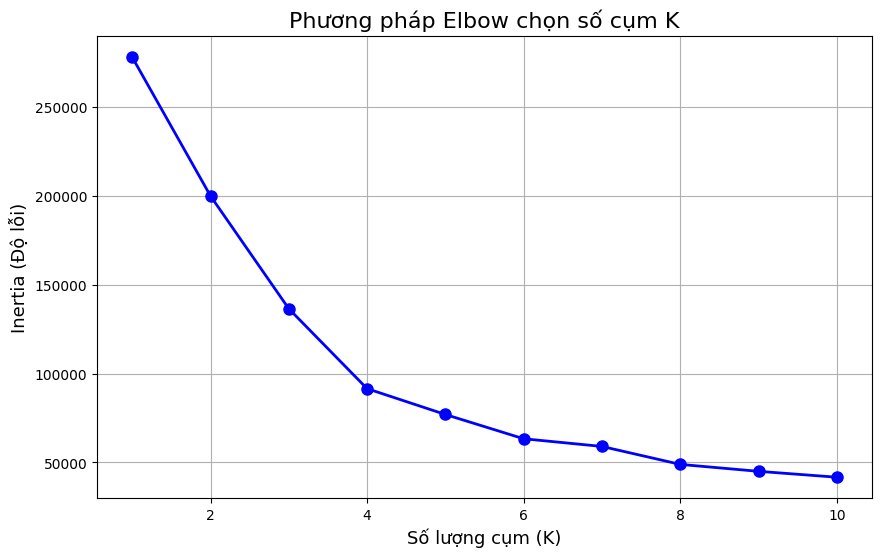

In [4]:
from sklearn.cluster import KMeans

inertia = []
K_range = range(1, 11)

# Chạy vòng lặp để tính Inertia cho từng K
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(rfm_scaled)
    inertia.append(kmeans.inertia_) # Lưu lại giá trị SSE

# Vẽ biểu đồ Elbow
plt.figure(figsize=(10, 6))
plt.plot(K_range, inertia, 'bo-', markersize=8, linewidth=2)
plt.xlabel('Số lượng cụm (K)', fontsize=13)
plt.ylabel('Inertia (Độ lỗi)', fontsize=13)
plt.title('Phương pháp Elbow chọn số cụm K', fontsize=16)
plt.grid(True)
plt.savefig('elbow_method_kmeans.png', dpi=300, bbox_inches='tight')
plt.show()

*Nhận xét:* Dựa trên phương pháp Elbow Method, nhóm quyết định chọn K = 4 là số lượng cụm tối ưu, đảm bảo sự tách biệt rõ ràng giữa các nhóm hành vi mua sắm mà không làm dữ liệu bị phân mảnh quá nhỏ.

### 3.3. Thuật toán K - Means và đánh giá mô hình
Sau khi phân tích biểu đồ Elbow, nhóm quyết định chọn *K = 4* để phân chia khách hàng thành 4 nhóm đặc thù.

Đánh giá mô hình: Nhóm sử dụng chỉ số Silhouette Score để đo lường chất lượng và độ tách biệt giữa các phân cụm:

   \- Ý nghĩa chỉ số: Hệ số Silhouette nằm trong khoảng $[-1, 1]$. Giá trị càng tiến gần đến $1$ chứng tỏ các điểm dữ liệu trong cùng một cụm có độ tương đồng cao và tách biệt rõ rệt với các cụm khác.

In [5]:
from sklearn.metrics import silhouette_score

# Khởi tạo và huấn luyện mô hình với K=4
k_final = 4
kmeans_model = KMeans(n_clusters=k_final, random_state=42)
kmeans_model.fit(rfm_scaled)

# Gán nhãn cụm
rfm_df['Cluster'] = kmeans_model.labels_

# Tính toán Silhouette Score
score = silhouette_score(rfm_scaled, kmeans_model.labels_)
print(f" Với K = {k_final}, Silhouette Score = {score:.3f}")

# Phân tích đặc điểm từng cụm
cluster_summary = rfm_df.groupby('Cluster').agg({
    'Recency': 'mean',
    'Frequency': 'mean',
    'Monetary': 'mean',
    'customer_unique_id': 'count'
}).reset_index()

cluster_summary.columns = ['Cluster', 'Avg_Recency', 'Avg_Frequency', 'Avg_Monetary', 'Count (Số lượng khách)']
display(cluster_summary.round(2))

 Với K = 4, Silhouette Score = 0.489


,Cluster,Avg_Recency,Avg_Frequency,Avg_Monetary,Count (Số lượng khách)
0,0,239.18,1.01,1160.16,2403
1,1,387.39,1.00,133.43,37274
2,2,127.97,1.00,134.26,50345
3,3,220.47,2.11,307.48,2731


## 3.4. Định danh và gán nhãn phân khúc

Dựa trên các chỉ số trung bình của R-F-M đã phân tích ở bước trước, nhóm quyết định gán các nhãn cụ thể cho 4 cụm khách hàng như sau:

| Cluster ID  | Phân Khúc | Đặc điểm |
| :--- | :--- | :--- |
| **0** | Potential Loyalty Customers (Khách hàng tiềm năng) | Nhóm có Monetary cao vượt trội nhưng Frequency thấp. |
| **1** | At Risk Customers (Khách hàng rời bỏ) | Nhóm có Recency cao nhất (đã lâu không quay lại). |
| **2** | Need Attention Customers (Khách hàng mới) | Nhóm có Recency thấp (mới mua) và chi tiêu trung bình. |
| **3** | Loyal Customers (Khách hàng trung thành) | Nhóm có Frequency cao nhất và Monetary khá tốt. |



--- KẾT QUẢ PHÂN KHÚC KHÁCH HÀNG ---


,Cluster,Segment_Name,Recency,Frequency,Monetary
0,2,Need Attention Customers (Khách hàng mới),112,1,141.90
1,2,Need Attention Customers (Khách hàng mới),115,1,27.19
2,1,At Risk Customers (Khách hàng rời bỏ),537,1,86.22
3,1,At Risk Customers (Khách hàng rời bỏ),321,1,43.62
4,1,At Risk Customers (Khách hàng rời bỏ),288,1,196.89


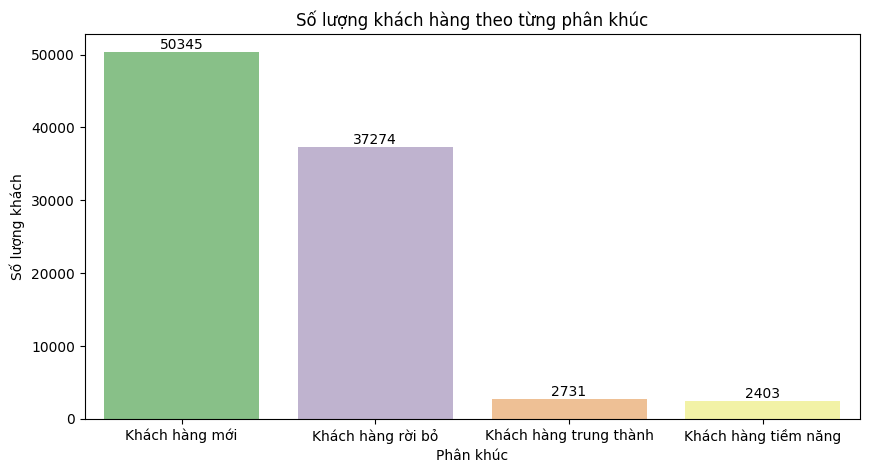

In [6]:
cluster_names = {
    0: 'Potential Loyalty Customers (Khách hàng tiềm năng)',
    1: 'At Risk Customers (Khách hàng rời bỏ)',
    2: 'Need Attention Customers (Khách hàng mới)',
    3: 'Loyal Customers (Khách hàng trung thành)'
}

rfm_df['Segment_Name'] = rfm_df['Cluster'].map(cluster_names)

print("\n--- KẾT QUẢ PHÂN KHÚC KHÁCH HÀNG ---")
display(rfm_df[['Cluster', 'Segment_Name', 'Recency', 'Frequency', 'Monetary']].head())

# Đếm số lượng khách theo phân khúc
segment_counts = rfm_df['Segment_Name'].value_counts().reset_index()
segment_counts.columns = ['Phân khúc', 'Số lượng khách']

short_labels = {
    'Potential Loyalty Customers (Khách hàng tiềm năng)': 'Khách hàng tiềm năng',
    'At Risk Customers (Khách hàng rời bỏ)': 'Khách hàng rời bỏ',
    'Need Attention Customers (Khách hàng mới)': 'Khách hàng mới',
    'Loyal Customers (Khách hàng trung thành)': 'Khách hàng trung thành'
}
segment_counts['Label_Short'] = segment_counts['Phân khúc'].map(short_labels)


plt.figure(figsize=(10, 5))
ax = sns.barplot(
    data=segment_counts,
    x='Label_Short',
    y='Số lượng khách',
    hue='Phân khúc',
    palette='Accent',
    legend=False
)

plt.title('Số lượng khách hàng theo từng phân khúc')
ax.set_xlabel('Phân khúc')
ax.set_ylabel('Số lượng khách')
for p in ax.patches:
    ax.text(p.get_x()+p.get_width()/2, p.get_height(),
            int(p.get_height()), ha='center', va='bottom')

plt.savefig("so_luong_khach_theo_phan_khuc.png", dpi=300, bbox_inches='tight')
plt.show()

*Nhận xét:* Nhận diện phân khúc khách hàng thông qua thuật toán K-Means với số cụm tối ưu K = 4, đã nhận diện được 4 nhóm khách hàng dựa trên hành vi mua sắm thực tế:

| Phân khúc | Số lượng khách hàng | Đặc điểm hành vi |
| :--- | :--- | :--- |
| Khách hàng mới |50.345 | Mới mua hàng gần đây, chi tiêu ở mức trung bình. |
| Khách hàng rời bỏ | 37.274 | Đã rất lâu không quay lại mua hàng trên nền tảng. |
| Khách hàng trung thành | 2.731 | Mua hàng thường xuyên nhất và mua rất gần đây. |
| Khách hàng tiềm năng | 2.403 | Chi tiêu rất cao nhưng tần suất mua hàng còn thấp. |

### 3.5. Trực quan hóa kết quả (3D Visualization)

\- Để có cái nhìn trực quan nhất về sự phân tách giữa các nhóm khách hàng, sử dụng biểu đồ không gian 3 chiều (3D Scatter Plot) để quan sát sự phân tách giữa các nhóm khách hàng dựa trên 3 trục Recency, Frequency và Monetary.

\- Kết quả phân cụm được lưu vào file `clusters.csv`. File này bao gồm thông tin định danh khách hàng và nhãn phân nhóm.

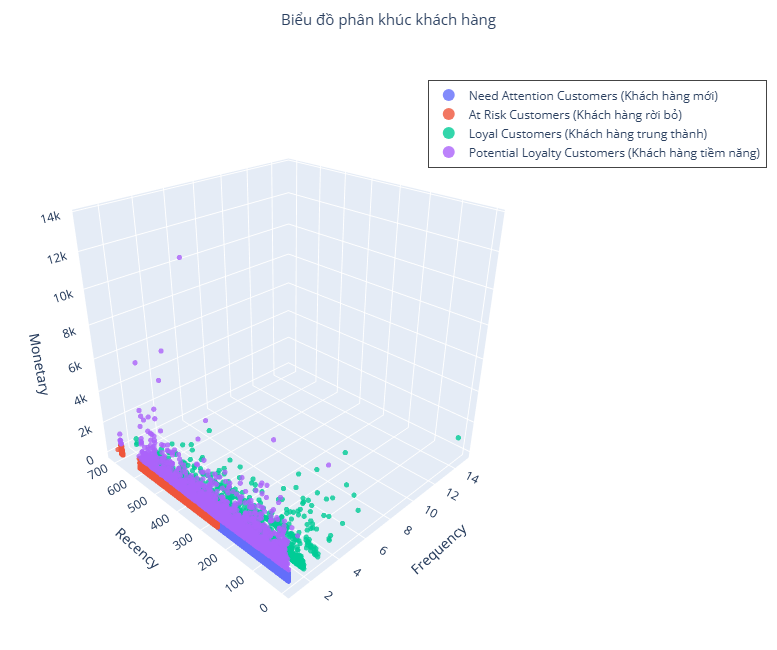

Đã xuất file dữ liệu 'clusters.csv'.


In [7]:
import plotly.express as px

fig = px.scatter_3d(
    rfm_df,
    x='Recency',
    y='Frequency',
    z='Monetary',
    color='Segment_Name',
    title='Biểu đồ phân khúc khách hàng',
    opacity=0.8,
    labels={
        'Recency': 'Recency',
        'Frequency': 'Frequency',
        'Monetary': 'Monetary',
        'Segment': 'Customer Segment'
    },
    width=900,
    height=650
)

fig.update_traces(marker=dict(size=3))

fig.update_layout(
    title=dict(
        font=dict(size=15),   
        x=0.5,
        xanchor='center'
    ),
    legend=dict(
        title='',
        font=dict(size=12),
        x=0.75,             
        y=0.95,
        bgcolor='rgba(255,255,255,0.8)',
        borderwidth=1,
        itemsizing='constant'
    ),
    margin=dict(l=10, r=10, t=50, b=10),
    scene=dict(
        xaxis=dict(title='Recency', autorange='reversed'),
        yaxis=dict(title='Frequency'),
        zaxis=dict(title='Monetary'),
        camera=dict(eye=dict(x=1.6, y=-1.6, z=1.2))
    )
)

fig.write_image("rfm_3d_plot.png", scale=2)
fig.write_html("rfm_3d_plot.html")
fig.show()

output_cols = ['customer_unique_id', 'Cluster', 'Recency', 'Frequency', 'Monetary']
rfm_df[output_cols].to_csv('clusters.csv', index=False)
print("Đã xuất file dữ liệu 'clusters.csv'.")

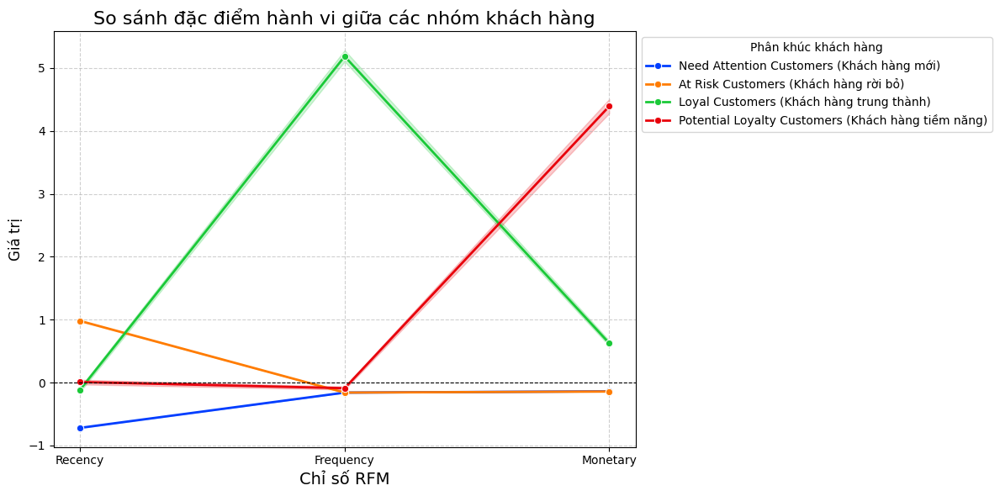

In [8]:
rfm_scaled_plot = pd.DataFrame(rfm_scaled, columns=['Recency', 'Frequency', 'Monetary'])

rfm_scaled_plot['Segment_Name'] = rfm_df['Segment_Name'].values

df_melt = pd.melt(rfm_scaled_plot,
                  id_vars=['Segment_Name'],
                  value_vars=['Recency', 'Frequency', 'Monetary'],
                  var_name='Attribute',
                  value_name='Value')

plt.figure(figsize=(12, 6))

sns.lineplot(x="Attribute", y="Value", hue="Segment_Name", data=df_melt,
             palette="bright", marker="o", linewidth=2)

plt.title('So sánh đặc điểm hành vi giữa các nhóm khách hàng', fontsize=16)
plt.xlabel('Chỉ số RFM', fontsize=14)
plt.ylabel('Giá trị', fontsize=12)
plt.axhline(0, color='black', linestyle='--', linewidth=0.8) 

plt.legend(title='Phân khúc khách hàng', loc='upper left', bbox_to_anchor=(1, 1))
plt.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.savefig('snake_plot.png', dpi=300)
plt.show()

#### Giải pháp chiến lược cho 4 phân khúc khách hàng trên Olist: 
Để gia tăng sự gắn bó lâu dài, Olist cần áp dụng các chiến lược tương tác riêng biệt cho từng nhóm khách hàng:

| Phân khúc              | Đặc điểm nhận dạng (Insight)                                      | Chiến lược đề xuất |
|------------------------|-------------------------------------------------------------------|-------------------|
| Khách hàng trung thành | Mua hàng thường xuyên nhất và mua rất gần đây.                    | Tập trung duy trì mối quan hệ thông qua các chương trình tri ân đặc biệt và ưu đãi dành riêng. |
| Khách hàng tiềm năng   | Chi tiêu rất cao nhưng tần suất mua hàng còn thấp.                | Khuyến khích mua sắm thêm bằng cách giới thiệu sản phẩm liên quan hoặc cung cấp các gói ưu đãi combo. |
| Khách hàng mới         | Mới thực hiện đơn hàng đầu tiên, cần sự quan tâm.                 | Tăng cường gắn kết bằng cách gửi đề xuất sản phẩm dựa trên đơn hàng đầu tiên và theo dõi sự hài lòng. |
| Khách hàng rời bỏ   | Đã rất lâu không quay lại mua hàng trên nền tảng.                 | Triển khai các chiến dịch tặng quà và giảm giá đặc biệt để khơi dậy hứng thú mua sắm. |
